# Import what we need

In [266]:
import sys
import numpy as np
import pandas as pd
import scanpy.api as sc
import anndata as ad
from scipy.sparse import csr_matrix
import logging
import os
import matplotlib.pyplot as plt
import seaborn as sns
import csv
import scipy.stats as stats
import statsmodels.formula.api as smf
import statsmodels.api as sm
import math
import gc
import random

In [267]:
%matplotlib inline

##################
# Configure file #
##################
sc.settings.verbosity = 2
sc.settings.autoshow = False

##logging.basicConfig(filename="CLUESImmVar_processed.V4.1.log", level=logging.ERROR)
sc.settings.set_figure_params(dpi=100, dpi_save=600, format='png')

plt.rcParams["image.aspect"] = "equal"
##%matplotlib inline

# Read in the data, this could take a while

In [268]:
adata = sc.read('V5.1.flareAb.h5ad', cache=True)
print(adata)
figdir = "./figures."
sc.settings.figdir = "./figures."

Only considering the two last: ['.flareAb', '.h5ad'].
Only considering the two last: ['.flareAb', '.h5ad'].
AnnData object with n_obs × n_vars = 133440 × 1228 
    obs: 'source', 'well', 'batch_cov', 'Female', 'Broad', 'CD38|CD38|j95-01|pAbO', 'CD95|FAS|j95-02|pAbO', 'CD28|CD28|j95-07|pAbO', 'CD27|CD27|j95-08|pAbO', 'CD197|CCR7|j95-09|pAbO', 'CD19|CD19|j95-10|pAbO', 'CD161|KLRB1|j95-11|pAbO', 'CD183|CXCR3|j95-12|pAbO', 'CD4|CD4|j95-14|pAbO', 'CD3|CD3E|j95-16|pAbO', 'CD196|CCR6|j95-17|pAbO', 'HLA-DR|CD74|j95-18|pAbO', 'CD45RO|PTPRC|j95-19|pAbO', 'CD14|CD14|j95-20|pAbO', 'CD194|CCR4|j95-21|pAbO', 'CD185|CXCR5|j95-22|pAbO', 'CD25|IL2RA|j95-24|pAbO', 'CD8|CD8A|j95-25|pAbO', 'CD127|IL7R|j95-27|pAbO', 'CD45RA|PTPRC|j95-28|pAbO', 'disease_cov', 'ind_cov', 'percent_mito', 'n_counts', 'n_genes', 'PF4', 'SDPR', 'GNG11', 'PPBP', 'PC3', 'PC15', 'PC16', 'flare.1', 'flare.2', 'flare.3', 'flare.4', 'louvain', 'leiden'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'ba

In [269]:
# id	source	status
# 101	HEALTHY	UCSF
# 1771	HEALTHY	UCSF/CLUES
# 256	HEALTHY	IMMVAR
# 1921	HEALTHY	IMMVAR
# 1290	HEALTHY	IMMVAR
# 514	HEALTHY	IMMVAR
# 1791	HEALTHY	UCSF/CLUES
# 1754	HEALTHY	UCSF/CLUES
# 1586 (002, 003, or 008)	FLARE	FLARE
# 1763 (002, 003, or 008)	FLARE	FLARE
# 904194200 (002, 003, or 008)	FLARE	FLARE
# 1804 (900805200)	HEALTHY	UCSF/CLUES

In [ ]:
# Sample ID	Date of Draw	Lupus Flare  	CLUES 	CLUES ID
# 001-01	8/14/2017	Yes	No	
# 001-02	12/18/2017	No - symptoms have improved some, but patient did not start meds		
# 002-01	8/30/2017	Yes	yes	1586
# 002-02	11/29/2017	No	yes	1586
# 003-01	9/6/2017	Yes	yes	1130
# 003-02	12/6/2017	No	yes	1130
# 004-01	9/13/2017	Yes	yes - no blood	2195
# 004-02	10/4/2017	No	yes - no blood	2195
# 005-01	9/25/2017	Yes	no	
# 006-01	10/3/2017	Yes	no	
# 007-01	10/11/2017	Yes	yes - no blood	
# 008-01	11/13/2017	Yes		
# 008-02	3/16/2018	No	yes	1763
# 009-01	11/20/2017	Yes		
# 009-02	3/15/2018	No - however disease activity still high	no	
# 010-01	12/4/2017	Yes	no	
# 010-02	3/19/2018	No	yes - no blood	1540
# 011-01	12/4/2017	Yes	no	
# 012-01	12/11/2017	Yes	no	
# 012-02	3/26/2018	No	no	
# 013-01	1/8/2018	Yes	no	
# 013-02	2/26/2018	No - improved but patient not fully in remission	no	
# 014-01	1/9/2018		yes - no blood	1550
# 015-01	1/23/2018	Yes	no	
# 016-01	1/29/2018	Yes	yes - no blood	1524
# 017-01	2/26/2018	Yes	yes - no blood	1563
# 018-01	3/19/2018	yes	yes	1772
# 019-01	3/21/2018	yes	yes	2132
# 020-01	3/5/2018	yes	no	

In [ ]:
# 	ID	SOURCE	STATUS	PAIR
# 3 - demux	HC-502-01	UCSF	HEALTHY	FALSE
# 3 - demux	FLARE016-01	FLARE	TR	TRUE
# 3 - demux	FLARE014-01	FLARE	UNT	FALSE
# 3 - demux	IGTB195	IMMVAR	HEALTHY	FALSE
# 3 - demux	FLARE013-01	FLARE	TR	TRUE
# 3 - demux	FLARE006-01	FLARE	UNT	FALSE
# 3 - demux	101	UCSF	HEALTHY	FALSE
# 3 - demux	HC-504-01	UCSF	HEALTHY	FALSE
# 3 - demux	FLARE015-01	FLARE	UNT	FALSE
# 3 - demux	FLARE007-01	FLARE	UNT	FALSE
# 3 - demux	FLARE005-01	FLARE	UNT	FALSE
# 3 - demux	IGTB508	IMMVAR	HEALTHY	FALSE
# 3 - demux	FLARE009-01	FLARE	UNT	TRUE
# 3 - demux	IGTB826	IMMVAR	HEALTHY	FALSE
# 3 - demux	HC-501-01	UCSF	HEALTHY	FALSE
# 3 - demux	FLARE004-01	FLARE	UNT	TRUE
# 3 - demux	FLARE011-01	FLARE	TR	TRUE
# 4 - demux	2132DNA01	FLARE	UNT	FALSE
# 4 - demux	101	UCSF	HEALTHY	FALSE
# 4 - demux	FLARE013-01	FLARE	UNT	TRUE
# 4 - demux	FLARE016-01	FLARE	UNT	TRUE
# 4 - demux	IGTB469	IMMVAR	HEALTHY	FALSE
# 4 - demux	HC-002-01	UCSF	HEALTHY	FALSE
# 4 - demux	HC-020-01	UCSF	HEALTHY	FALSE
# 4 - demux	1772	FLARE	UNT	FALSE
# 4 - demux	IGTB1372	IMMVAR	HEALTHY	FALSE
# 4 - demux	FLARE020-01	FLARE	UNT	FALSE
# 4 - demux	HC-506-01	UCSF	HEALTHY	FALSE
# 4 - demux	HC-503-01	UCSF	HEALTHY	FALSE
# 4 - demux	FLARE009-01	FLARE	TR	TRUE
# 4 - demux	HC-014-01	UCSF	HEALTHY	FALSE
# 4 - demux	FLARE004-01	FLARE	TR	TRUE
# 4 - demux	IGTB1506	IMMVAR	HEALTHY	FALSE
# 4 - demux	FLARE011-01	FLARE	UNT	TRUE
# 4 - demux	FLARE017-01	FLARE	UNT	FALSE
# 3 - freemux	HC-502	UCSF	HEALTHY	FALSE
# 3 - freemux	FLARE016	FLARE	TR	TRUE
# 3 - freemux	FLARE014	FLARE	UNT	FALSE
# 3 - freemux	IGTB195	IMMVAR	HEALTHY	FALSE
# 3 - freemux	FLARE013	FLARE	TR	TRUE
# 3 - freemux	FLARE006	FLARE	UNT	FALSE
# 3 - freemux	101	UCSF	HEALTHY	FALSE
# 3 - freemux	HC-504	UCSF	HEALTHY	FALSE
# 3 - freemux	FLARE015	FLARE	UNT	FALSE
# 3 - freemux	FLARE007	FLARE	UNT	FALSE
# 3 - freemux	FLARE005	FLARE	UNT	FALSE
# 3 - freemux	IGTB508	IMMVAR	HEALTHY	FALSE
# 3 - freemux	FLARE009	FLARE	UNT	TRUE
# 3 - freemux	IGTB826	IMMVAR	HEALTHY	FALSE
# 3 - freemux	HC-501	UCSF	HEALTHY	FALSE
# 3 - freemux	FLARE004	FLARE	UNT	TRUE
# 3 - freemux	FLARE011	FLARE	TR	TRUE
# 3 - freemux	FLARE010	FLARE	TR	TRUE
# 3 - freemux	FLARE001	FLARE	UNT	TRUE
# 4 - freemux	2132DNA01	FLARE	UNT	FALSE
# 4 - freemux	101	UCSF	HEALTHY	FALSE
# 4 - freemux	FLARE013	FLARE	UNT	TRUE
# 4 - freemux	FLARE016	FLARE	UNT	TRUE
# 4 - freemux	IGTB469	IMMVAR	HEALTHY	FALSE
# 4 - freemux	HC-002	UCSF	HEALTHY	FALSE
# 4 - freemux	HC-020	UCSF	HEALTHY	FALSE
# 4 - freemux	1772	FLARE	UNT	FALSE
# 4 - freemux	IGTB1372	IMMVAR	HEALTHY	FALSE
# 4 - freemux	FLARE020	FLARE	UNT	FALSE
# 4 - freemux	HC-506	UCSF	HEALTHY	FALSE
# 4 - freemux	HC-503	UCSF	HEALTHY	FALSE
# 4 - freemux	FLARE009	FLARE	TR	TRUE
# 4 - freemux	HC-014	UCSF	HEALTHY	FALSE
# 4 - freemux	FLARE004	FLARE	TR	TRUE
# 4 - freemux	IGTB1506	IMMVAR	HEALTHY	FALSE
# 4 - freemux	FLARE011	FLARE	UNT	TRUE
# 4 - freemux	FLARE017	FLARE	UNT	FALSE
# 4 - freemux	FLARE010	FLARE	UNT	TRUE
# 4 - freemux	FLARE001	FLARE	TR	TRUEa

In [302]:
## from runs 1 and 2
## these are labeled as healthy from CLUES but pretty sure they are treated CLUES samples
## and not true healthies
adata.obs.loc[adata.obs.ind_cov == "1754","disease_cov"] = "TR"
adata.obs.loc[adata.obs.ind_cov == "1771","disease_cov"] = "TR"
adata.obs.loc[adata.obs.ind_cov == "1791","disease_cov"] = "TR"
adata.obs.loc[adata.obs.ind_cov == "900805200","disease_cov"] = "TR"

## from run 3 and 4
adata.obs.loc[adata.obs.ind_cov == "1772","disease_cov"] = "UNT"


In [324]:
## not sure what the mapping should be here...
## just know that all three samples are in runs 1 and 2
## should be flare2, flare3 and flare8
adata.obs.loc[(adata.obs.ind_cov == "1586") & (adata.obs.batch_cov == "flare.1"),"disease_cov"] = "TR"
adata.obs.loc[(adata.obs.ind_cov == "1586") & (adata.obs.batch_cov == "flare.2"),"disease_cov"] = "UNT"

adata.obs.loc[(adata.obs.ind_cov == "1763") & (adata.obs.batch_cov == "flare.1"),"disease_cov"] = "UNT"
adata.obs.loc[(adata.obs.ind_cov == "1763") & (adata.obs.batch_cov == "flare.2"),"disease_cov"] = "TR"

adata.obs.loc[(adata.obs.ind_cov == "904194200") & (adata.obs.batch_cov == "flare.1"),"disease_cov"] = "UNT"
adata.obs.loc[(adata.obs.ind_cov == "904194200") & (adata.obs.batch_cov == "flare.2"),"disease_cov"] = "TR"


In [272]:
# HC-502-01 is not existent
# 101 is not existent, that's actually 1240?

# Make some diagnostic plots

## Next, check batch effects

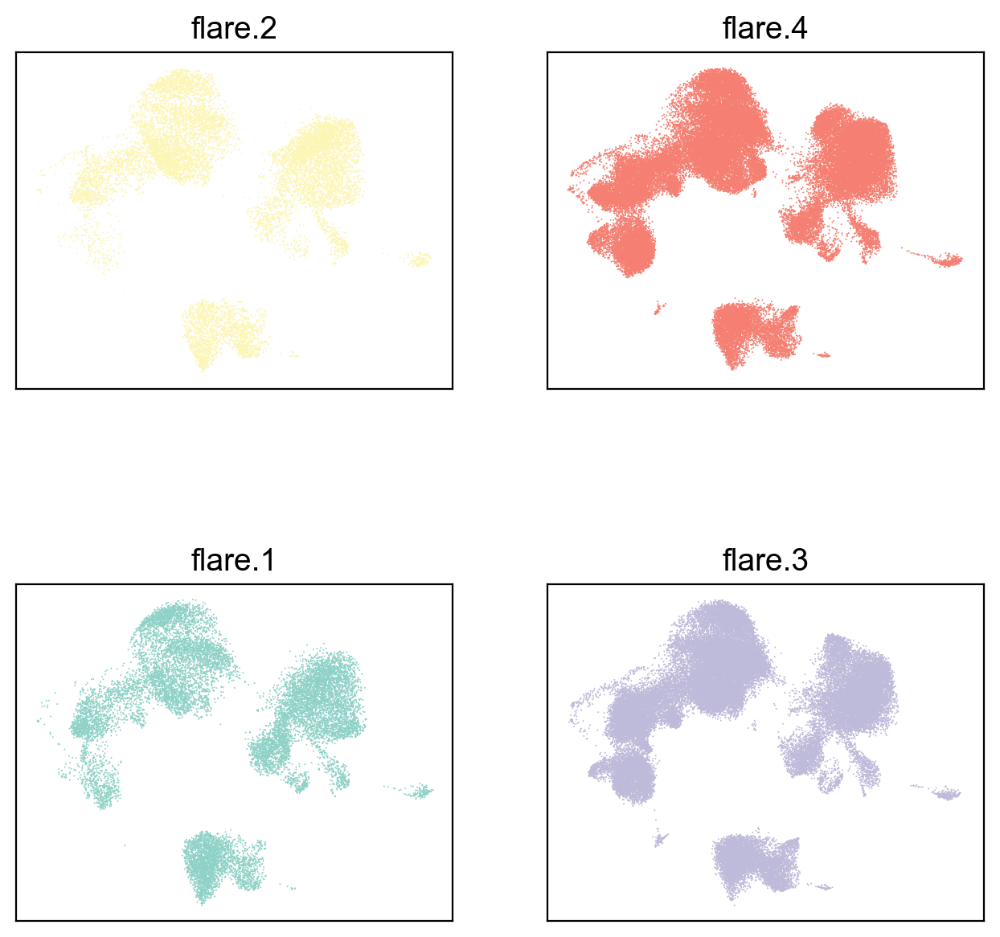

In [8]:
##sc.pl.umap(adata, color=['batch_cov'])
colors = ["#8ED1C6","#FCF6B5", "#BEBAD9", "#F47F72", "#81B1D3", "#FBB463", "#B4D66C", "#F9CEE1", "#DAD9D9", "#BC80B7", "#CDE6C4", "#FEEC6E", "#E31F26", "#387EB9", "#4EAF49", "#984F9F"];

fig,ax = plt.subplots(nrows=2,ncols=2, figsize=(7,7), sharex=True, sharey=True)
fig.tight_layout()
##plt.subplots_adjust(left=0, right=0.1, top=0.1, bottom=0, wspace=0.1, hspace=0.1)
##plt.subplots_adjust(wspace=0.1, hspace=0.1)

for batch_i in range(len(adata.obs.batch_cov.unique())) :
    batch = adata.obs.batch_cov.unique()[batch_i]
    col = colors[batch_i]
    sc.pl.umap(adata[adata.obs.batch_cov==batch,], color = "batch_cov", title=None, palette=[col,col], ax=ax[(batch_i-1)%2,math.floor(batch_i/2)], size=2, edgecolor="none")
    ##ax[(ind_i-1)%4,math.floor(ind_i/4)].label_outer()
    ax[(batch_i-1)%2,math.floor(batch_i/2)].get_xaxis().set_visible(False)
    ax[(batch_i-1)%2,math.floor(batch_i/2)].get_yaxis().set_visible(False)
    ax[(batch_i-1)%2,math.floor(batch_i/2)].get_legend().remove()
    ax[(batch_i-1)%2,math.floor(batch_i/2)].set_title(batch)
    ax[(batch_i-1)%2,math.floor(batch_i/2)].set_aspect("equal")
    
fig.savefig(figdir+'umap.batch.png')

# Figure 1B: Projection and dropprint

## Next, make the disease plot

saving figure to file ./figures./umap.disease.png


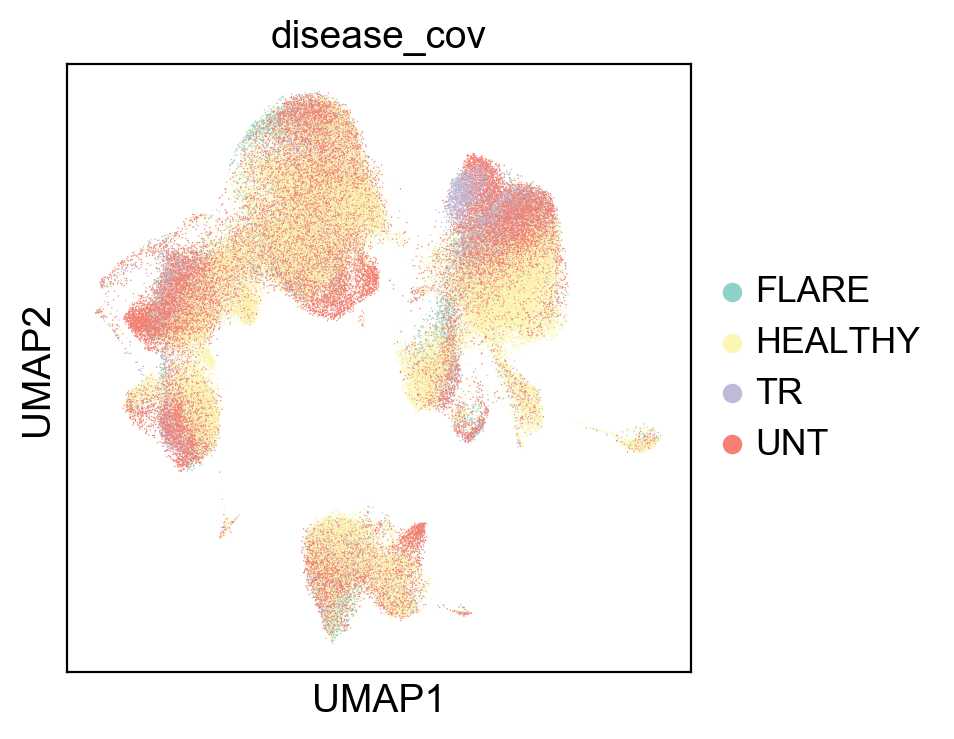

In [9]:
disease_umap = sc.pl.umap(adata, color='disease_cov', size=1, edgecolor="none", palette=["#8ED1C6","#FCF6B5", "#BEBAD9", "#F47F72"])
disease_umap = sc.pl.umap(adata, color='disease_cov', size=1, edgecolor="none", palette=["#8ED1C6","#FCF6B5", "#BEBAD9", "#F47F72"], save='.disease.png')

In [10]:
# ## Make disease plot (Fig. 1B)
# ## flipping the disease labels so that the healthy plots on top of the sle
# adata.obs['disease_cov'] = pd.Categorical(adata.obs['disease_cov'],categories=['sle','healthy'], ordered=True)
# ##adata.uns['disease_cov_colors'] = ['#3A87BC','#ED8A2F'];

# ##disease_tsne = sc.pl.tsne(adata, color='disease_cov', size=0.5)
# ##celltype_umap = sc.pl.umap(adata, color='ct_cov', size=1, edgecolor="none", save='.png')
# disease_umap = sc.pl.umap(adata, color='disease_cov', size=1, edgecolor="none", save='.disease.png')
# disease_umap = sc.pl.umap(adata, color='disease_cov', size=1, edgecolor="none")

# ## testing returning an axes object which should allow for more customization
# ## disease_tsne2 = sc.pl.tsne(adata, color='disease_cov', size=0.5, show=False)

# ## flipping the disease/healthy labels back for all of the downstream analysis
# adata.obs['disease_cov'] = pd.Categorical(adata.obs['disease_cov'],categories=['healthy','sle'], ordered=True)

## Now, let's make a plot for each of the 16 people in batch 1 as a demo of variability

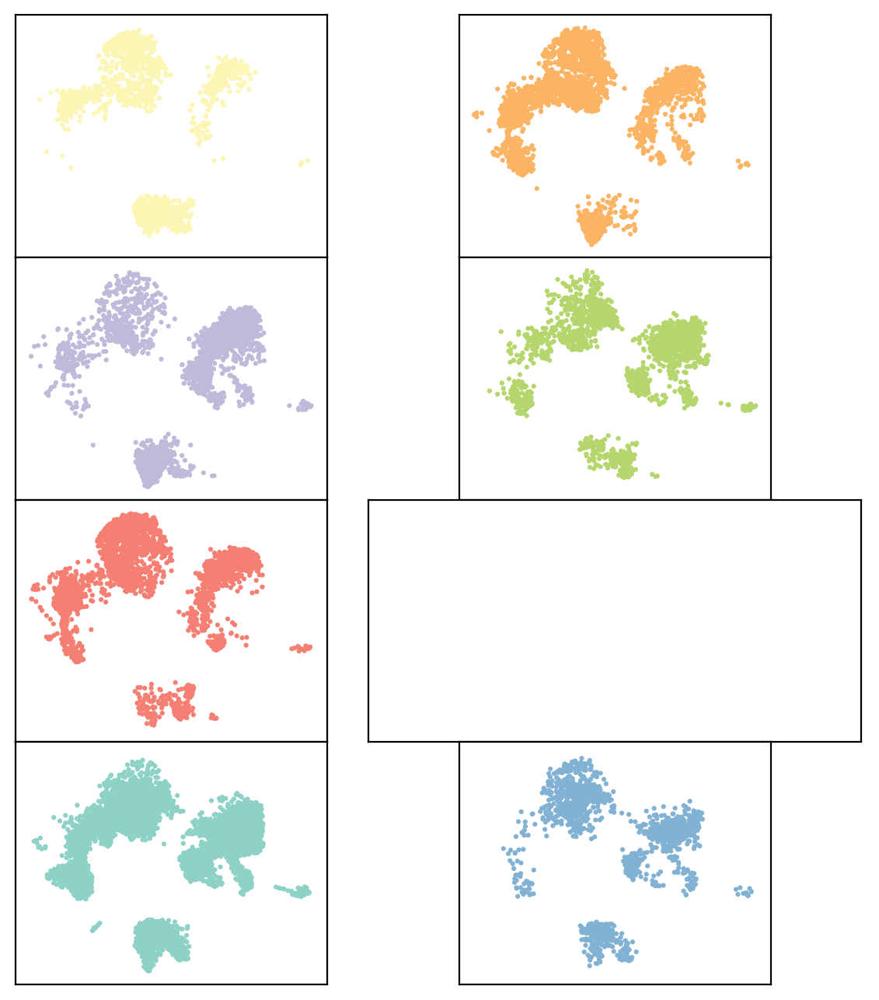

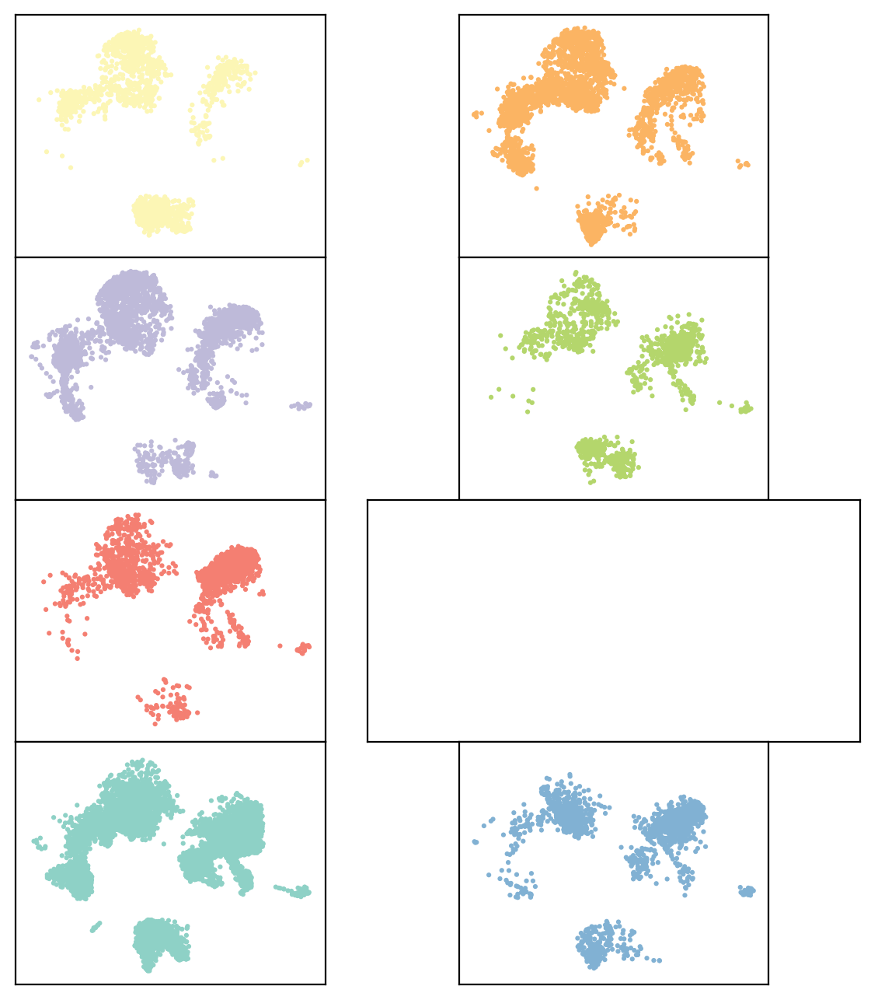

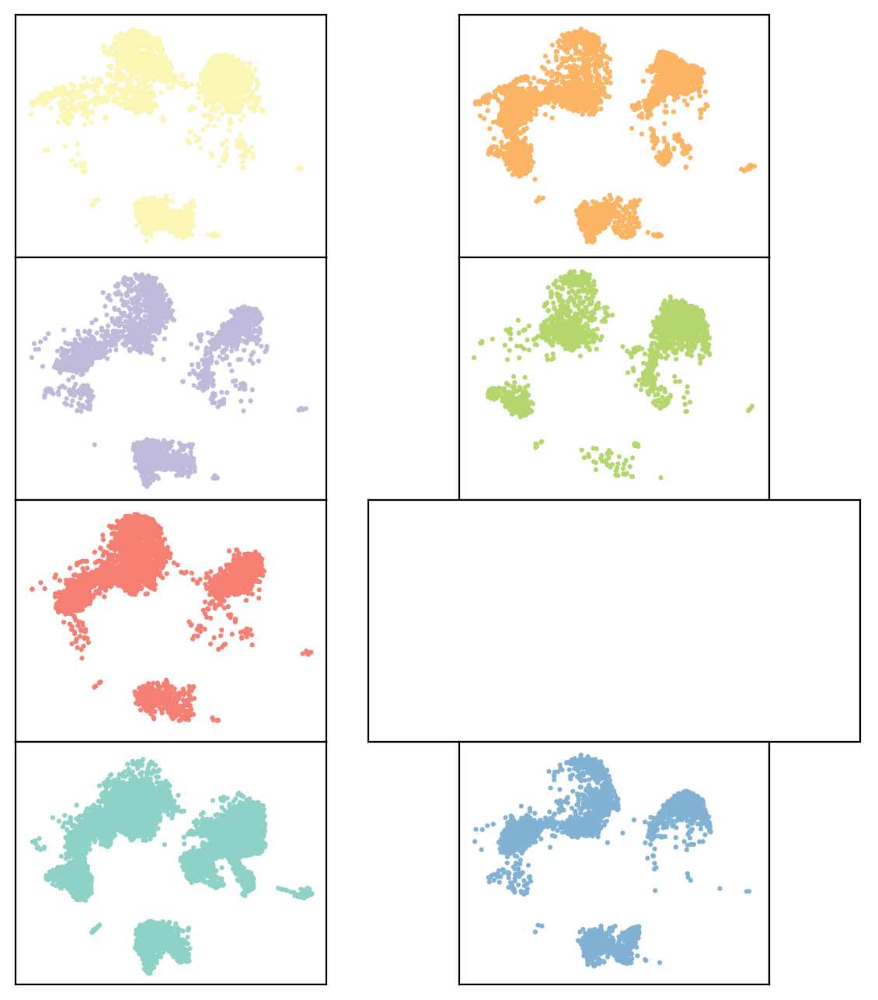

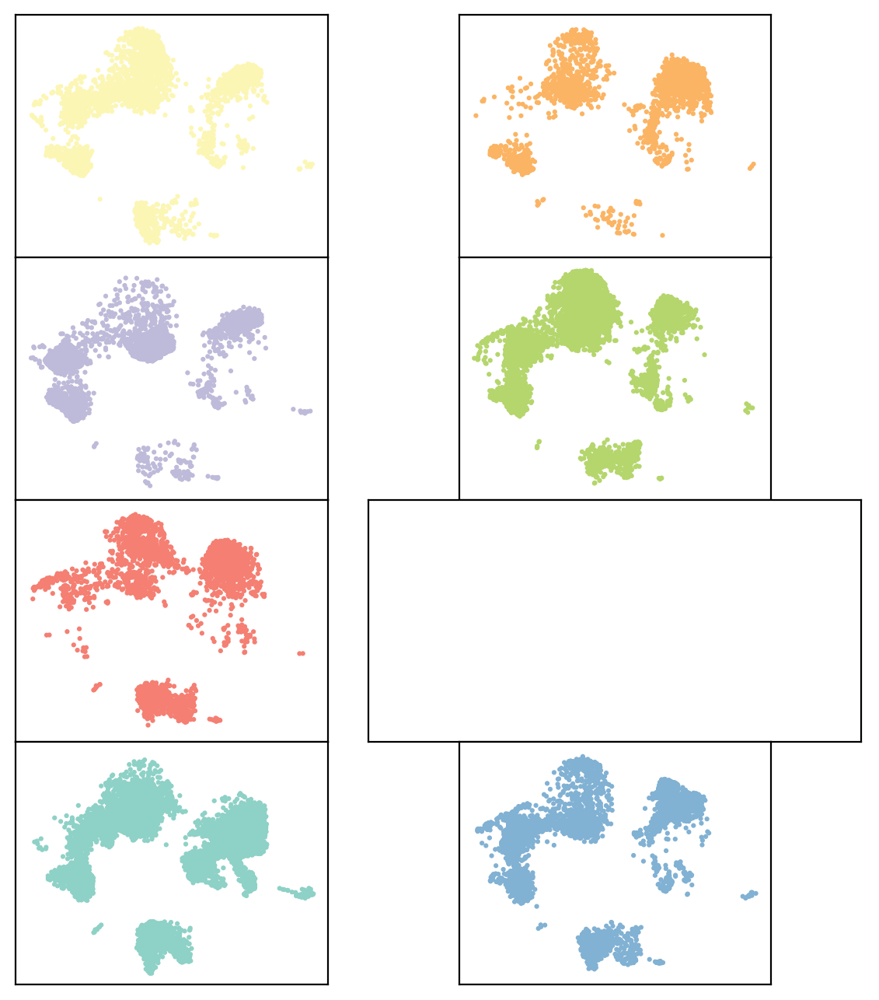

In [11]:
## let's plot 16 plots for the individuals in the first batch (Fig. 1B)
colors = ["#8ED1C6","#FCF6B5", "#BEBAD9", "#F47F72", "#81B1D3", "#FBB463", "#B4D66C", "#F9CEE1", "#DAD9D9", "#BC80B7", "#CDE6C4", "#FEEC6E", "#E31F26", "#387EB9", "#4EAF49", "#984F9F", "#984F9F"];
##batch_07_19_inds = adata.obs.ind_cov[adata.obs.batch_cov=='lupus7.19'].unique()
##batch_07_19_inds = np.sort(batch_07_19_inds.categories.values);

for batch_i in range(len(adata.obs.batch_cov.unique())) :
    fig,ax = plt.subplots(nrows=4,ncols=2, figsize=(7,7),sharex=True, sharey=True)
    fig.tight_layout()
    ##plt.subplots_adjust(left=0, right=0.1, top=0.1, bottom=0, wspace=0.1, hspace=0.1)
    plt.subplots_adjust(wspace=-0.1, hspace=0)

    batch_name = adata.obs.batch_cov.unique()[batch_i]
    batch = adata.obs.ind_cov[adata.obs.batch_cov==batch_name].unique();
    batch = np.sort(batch.categories.values)

    for ind_i in list(range(7)) :
        ind = batch[ind_i]
        col = colors[ind_i]
        sc.pl.umap(adata[adata.obs.ind_cov==ind,], color = "ind_cov", title=None, palette=[col,col], ax=ax[(ind_i-1)%4,math.floor(ind_i/4)], size=20, edgecolor="none")
        ##ax[(ind_i-1)%4,math.floor(ind_i/4)].label_outer()
        ax[(ind_i-1)%4,math.floor(ind_i/4)].get_xaxis().set_visible(False)
        ax[(ind_i-1)%4,math.floor(ind_i/4)].get_yaxis().set_visible(False)
        ax[(ind_i-1)%4,math.floor(ind_i/4)].get_legend().remove()
        ax[(ind_i-1)%4,math.floor(ind_i/4)].set_title("")
        ax[(ind_i-1)%4,math.floor(ind_i/4)].set_aspect("equal")
    
    fig.savefig(figdir+'/'+batch_name+'.ind.png')

In [12]:
# ## let's plot 16 plots for the individuals in the first batch (Fig. 1B)
# colors = ["#8ED1C6","#FCF6B5", "#BEBAD9", "#F47F72", "#81B1D3", "#FBB463", "#B4D66C", "#F9CEE1", "#DAD9D9", "#BC80B7", "#CDE6C4", "#FEEC6E", "#E31F26", "#387EB9", "#4EAF49", "#984F9F"];

# for batch_i in list(range(adata.obs.ind_cov))
# batch_07_19_inds = adata.obs.ind_cov[adata.obs.batch_cov=='lupus7.19'].unique()
# batch_07_19_inds = np.sort(batch_07_19_inds.categories.values);

# fig,ax = plt.subplots(nrows=4,ncols=4, figsize=(7,7),sharex=True, sharey=True)
# fig.tight_layout()
# ##plt.subplots_adjust(left=0, right=0.1, top=0.1, bottom=0, wspace=0.1, hspace=0.1)
# plt.subplots_adjust(wspace=0.1, hspace=-0.2)

# for ind_i in list(range(batch_07_19_inds.shape[0])) :
#     ind = batch_07_19_inds[ind_i]
#     col = colors[ind_i]
#     sc.pl.umap(adata[adata.obs.ind_cov==ind,], color = "ind_cov", title=None, palette=[col,col], ax=ax[(ind_i-1)%4,math.floor(ind_i/4)], size=20, edgecolor="none")
#     ##ax[(ind_i-1)%4,math.floor(ind_i/4)].label_outer()
#     ax[(ind_i-1)%4,math.floor(ind_i/4)].get_xaxis().set_visible(False)
#     ax[(ind_i-1)%4,math.floor(ind_i/4)].get_yaxis().set_visible(False)
#     ax[(ind_i-1)%4,math.floor(ind_i/4)].get_legend().remove()
#     ax[(ind_i-1)%4,math.floor(ind_i/4)].set_title("")
#     ax[(ind_i-1)%4,math.floor(ind_i/4)].set_aspect("equal")
    
# fig.savefig('figures/umap.ind.png')

# Figure 1C: Cell type annotation of projection

## First, let's make the louvain plot

In [13]:
# ##sc.pl.umap(adata, color=['batch_cov'])
# ##colors = ["#8ED1C6","#FCF6B5", "#BEBAD9", "#F47F72", "#81B1D3", "#FBB463", "#B4D66C", "#F9CEE1", "#DAD9D9", "#BC80B7", "#CDE6C4", "#FEEC6E", "#E31F26", "#387EB9", "#4EAF49", "#984F9F"];

# fig,ax = plt.subplots(nrows=5,ncols=6, figsize=(7,7), sharex=True, sharey=True)
# fig.tight_layout()
# ##plt.subplots_adjust(left=0, right=0.1, top=0.1, bottom=0, wspace=0.1, hspace=0.1)
# ##plt.subplots_adjust(wspace=0.1, hspace=0.1)

# for cluster_i in range(len(adata.obs.louvain.unique())) :
#     cluster = adata.obs.louvain.unique()[cluster_i]
#     if len(adata[adata.obs.louvain==cluster,]) > 0 :
#         col = sc.pl.palettes.default_26[cluster_i]
#         sc.pl.umap(adata[adata.obs.louvain==cluster,], color = "louvain", title=None, palette=[col,col], ax=ax[(cluster_i-1)%5,math.floor(cluster_i/5)], size=2, edgecolor="none")
#         ##ax[(ind_i-1)%4,math.floor(ind_i/4)].label_outer()
#         ax[(cluster_i-1)%5,math.floor(cluster_i/5)].get_xaxis().set_visible(False)
#         ax[(cluster_i-1)%5,math.floor(cluster_i/5)].get_yaxis().set_visible(False)
#         ax[(cluster_i-1)%5,math.floor(cluster_i/5)].get_legend().remove()
#         ax[(cluster_i-1)%5,math.floor(cluster_i/5)].set_title(cluster)
#         ax[(cluster_i-1)%5,math.floor(cluster_i/5)].set_aspect("equal")
    
# fig.savefig('figures/umap.cluster.louvain.png')

ranking genes
    finished (0:02:00.11)


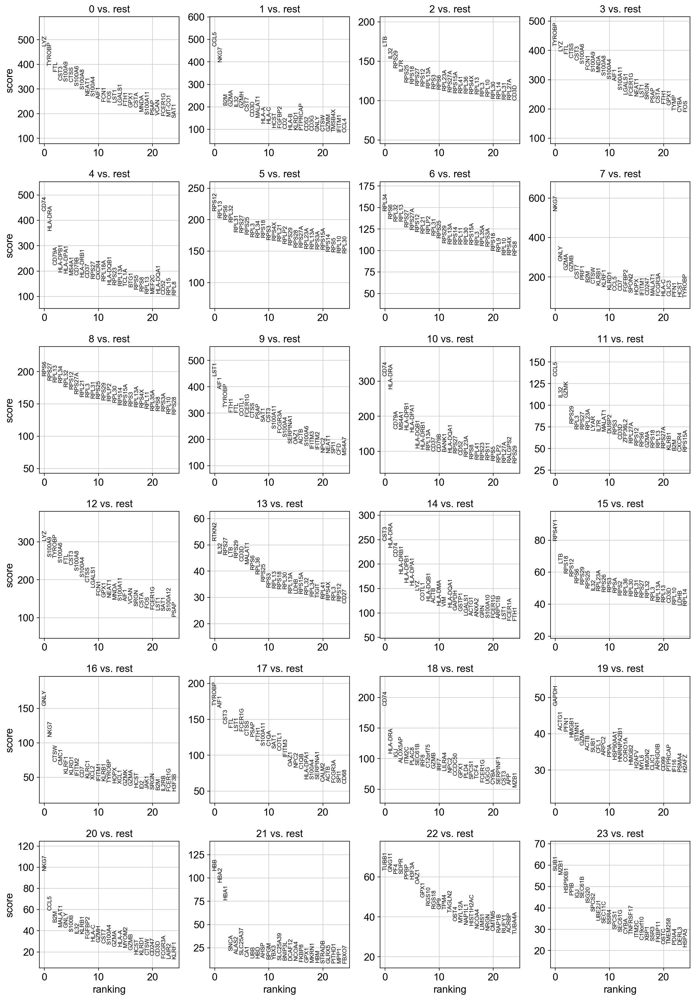

In [14]:
sc.tl.rank_genes_groups(adata, 'louvain', method='t-test')
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)

saving figure to file ./figures./umap.louvain.png


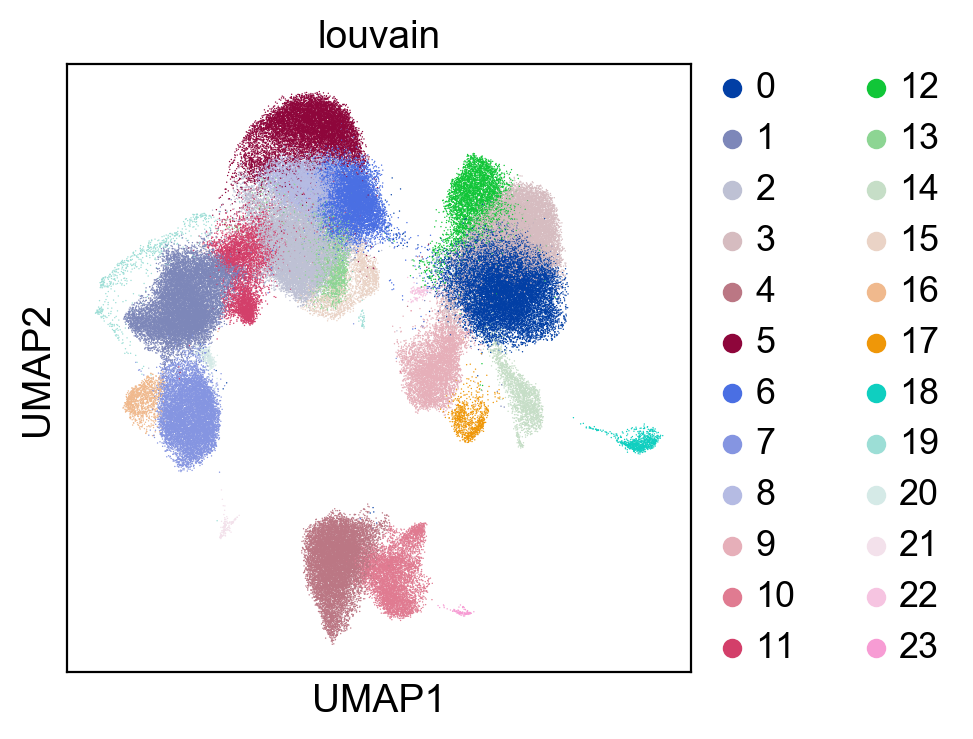

In [15]:
# sc.tl.louvain(adata, random_state=30, resolution=1.5)
sc.pl.umap(adata, color='louvain',size=1, edgecolor="none")
sc.pl.umap(adata, color='louvain', size=1, edgecolor="none", save='.louvain.png')

saving figure to file ./figures./umap.leiden.png


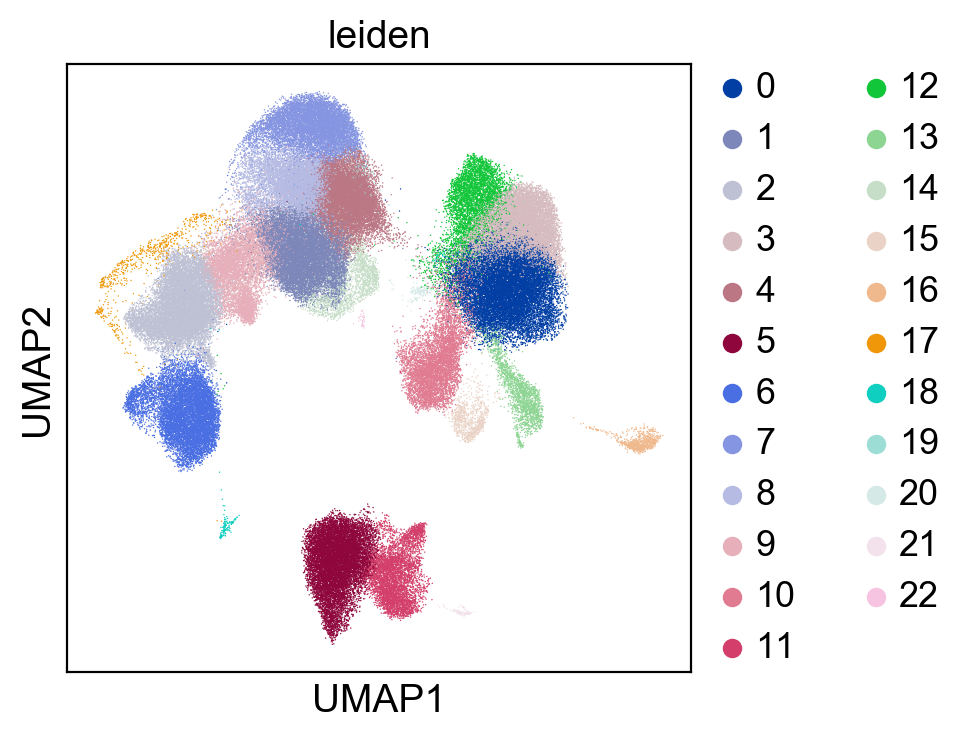

In [16]:
# sc.tl.louvain(adata, random_state=30, resolution=1.5)
sc.pl.umap(adata, color='leiden',size=1, edgecolor="none")
sc.pl.umap(adata, color='leiden', size=1, edgecolor="none", save='.leiden.png')

# Most expressed genes per leiden group

In [17]:
pd.set_option('display.max_columns', None)
unique_leiden = np.unique(adata.obs['leiden'].values)
# Compile list of top genes
GeneRanks = pd.DataFrame()
for ii in range(len(unique_leiden)):
    GeneRanks[str('leiden_' + str(ii))] = adata.var_names[np.flipud(np.argsort(np.mean(adata.X[adata.obs['leiden'] == str(ii)], axis=0)))]
GeneRanks.head(20)

,leiden_0,leiden_1,leiden_2,leiden_3,leiden_4,leiden_5,leiden_6,leiden_7,leiden_8,leiden_9,leiden_10,leiden_11,leiden_12,leiden_13,leiden_14,leiden_15,leiden_16,leiden_17,leiden_18,leiden_19,leiden_20,leiden_21,leiden_22
0,CSTA,IL7R,GZMH,MNDA,CCR7,TCL1A,KLRF1,RP11-291B21.2,PRKCQ-AS1,GZMK,CDKN1C,MS4A1,IL1R2,FCER1A,RPS4Y1,C1QB,LILRA4,KIAA0101,HBA1,C1QB,CLEC1B,MZB1,PRSS57
1,LGALS2,LTB,CCL5,CD14,IL7R,CD79A,GNLY,CD8B,TSHZ2,DUSP2,FCGR3A,CD79A,CD163,CLEC10A,EIF1AY,C1QA,SERPINF1,MKI67,HBA2,C1QA,CD9,TNFRSF17,LAPTM4B
2,VCAN,IL32,NKG7,FCN1,PRKCQ-AS1,MS4A1,GZMB,CCR7,IL7R,CCL5,HES4,BANK1,RETN,CD1C,DDX3Y,C1QC,TPM2,TYMS,ALAS2,C1QC,ESAM,IGJ,MYB
3,S100A12,TNFRSF4,CST7,S100A12,FHIT,CD79B,PRF1,LEF1,LTB,LYAR,MS4A7,RP5-887A10.1,VCAN,HLA-DQA1,LTB,FCGR3A,SCT,STMN1,CA1,ADTRP,SEPT5,DERL3,SOX4
4,MS4A6A,RTKN2,GZMA,VCAN,LEF1,VPREB3,SPON2,CD8A,ADTRP,IL32,RP11-290F20.3,TNFRSF13B,S100A12,HLA-DQB1,RPS26,MS4A7,PLD4,TK1,HBB,LEF1,CALD1,ITM2C,SPINK2
5,CST3,ITGB1,FGFBP2,CSTA,LTB,LINC00926,CLIC3,IL7R,FHIT,PIK3R1,LST1,AL928768.3,RNASE2,HLA-DPB1,SCGB3A1,HES4,CLEC4C,CENPF,SNCA,PRKCQ-AS1,GP1BA,AL928768.3,PTPLA
6,FCN1,AQP3,IL32,TYMP,MAL,FCER2,NKG7,CD27,TRAT1,IL7R,RHOC,BLK,CLEC4E,LMNA,MAL,LYPD2,IL3RA,BIRC5,HBD,IL7R,AC147651.3,HRASLS2,WBP5
7,CD14,CD3D,KLRD1,MS4A6A,CD27,BANK1,CTSW,S100B,MAL,KLRB1,LYPD2,RALGPS2,MNDA,HLA-DPA1,TTTY15,RP11-290F20.3,LRRC26,RRM2,BPGM,LTB,GAS2L1,IGLL5,EGFL7
8,GPX1,IL2RA,CD3D,CST3,CD3D,HLA-DRA,KLRD1,NUCB2,FAM13A,GZMA,SERPINA1,CLECL1,MGST1,HLA-DMA,TRAT1,CDKN1C,ITM2C,NUSAP1,HEMGN,CD3D,ARHGAP6,TNFRSF13B,ANKRD28
9,TYROBP,TRAT1,KLRG1,TNFSF13B,ADTRP,HLA-DQB1,GZMA,PRKCQ-AS1,LEF1,CD3D,IFITM3,CD79B,CSTA,HLA-DQA2,IL32,RHOC,SMPD3,TOP2A,TRIM58,TSHZ2,RP11-879F14.2,CD38,CCDC171


In [314]:
adata.obs['ct_cov'] = adata.obs['batch_cov'].astype("str")
# # ## do some manual cell type assignment
adata.obs['ct_cov'].loc[adata.obs.leiden == "0"] = "cM" ## good                                                                                    
adata.obs['ct_cov'].loc[adata.obs.leiden == "1"] = "T4" ## good                                                                                    
adata.obs['ct_cov'].loc[adata.obs.leiden == "2"] = "T8" ## good                                                                                     
adata.obs['ct_cov'].loc[adata.obs.leiden == "3"] = "cM" ## good                                                                                    
adata.obs['ct_cov'].loc[adata.obs.leiden == "4"] = "T4" ## good                                                                                    
adata.obs['ct_cov'].loc[adata.obs.leiden == "5"] = "B" ## good                                                                                    
adata.obs['ct_cov'].loc[adata.obs.leiden == "6"] = "NK" ## good                                                                                    
adata.obs['ct_cov'].loc[adata.obs.leiden == "7"] = "T8" ## good                                                                                    
adata.obs['ct_cov'].loc[adata.obs.leiden == "8"] = "T4" ## good                                                                                    
adata.obs['ct_cov'].loc[adata.obs.leiden == "9"] = "T8" ## good                                                                                    
adata.obs['ct_cov'].loc[adata.obs.leiden == "10"] = "ncM" ## good                                                                                  
adata.obs['ct_cov'].loc[adata.obs.leiden == "11"] = "B" ## good                                                                                    
adata.obs['ct_cov'].loc[adata.obs.leiden == "12"] = "cM" ## good                                                                                   
adata.obs['ct_cov'].loc[adata.obs.leiden == "13"] = "cDC" ## good                                                                                   
adata.obs['ct_cov'].loc[adata.obs.leiden == "14"] = "T4" ## good                                                                                  
adata.obs['ct_cov'].loc[adata.obs.leiden == "15"] = "ncM" ## good                                                                                   
adata.obs['ct_cov'].loc[adata.obs.leiden == "16"] = "pDC" ## good                                                                                   
adata.obs['ct_cov'].loc[adata.obs.leiden == "17"] = "ProlifT" ## good                                                                                  
adata.obs['ct_cov'].loc[adata.obs.leiden == "18"] = "RBC" ## good                                                                              
adata.obs['ct_cov'].loc[adata.obs.leiden == "19"] = "C1QT" ## good                                                                               
adata.obs['ct_cov'].loc[adata.obs.leiden == "20"] = "MK" ## good                                                                                   
adata.obs['ct_cov'].loc[adata.obs.leiden == "21"] = "B" ##
adata.obs['ct_cov'].loc[adata.obs.leiden == "22"] = "Progen" ## good                                                                                   
adata.obs['ct_cov'] = adata.obs.ct_cov.astype('category')

saving figure to file ./figures./umap.celltype.png


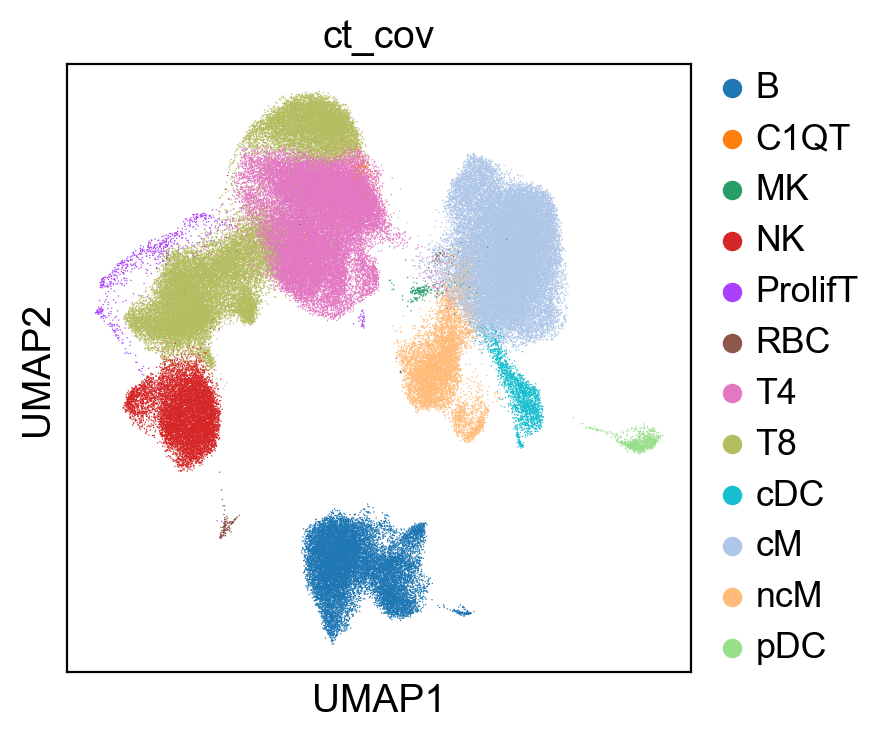

In [19]:
## Make cell type plot (Fig. 1C)
adata.uns['ct_cov_colors'] = sc.pl.palettes.vega_20_scanpy;
celltype_umap = sc.pl.umap(adata, color='ct_cov', size=1, edgecolor="none", save='.celltype.png')
celltype_umap = sc.pl.umap(adata, color='ct_cov',size=1, edgecolor="none")

saving figure to file ./figures./umap.platelet.png


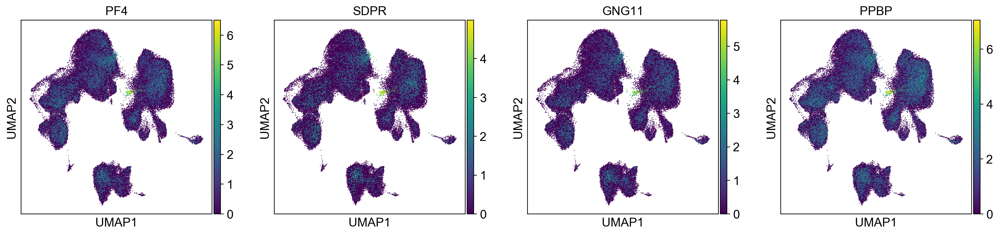

In [20]:
## platelet effect
sc.pl.umap(adata, color=["PF4", "SDPR", "GNG11", "PPBP"], size=3)
sc.pl.umap(adata, color=["PF4", "SDPR", "GNG11", "PPBP"], size=3, save='.platelet.png')

saving figure to file ./figures./umap.cycling.png


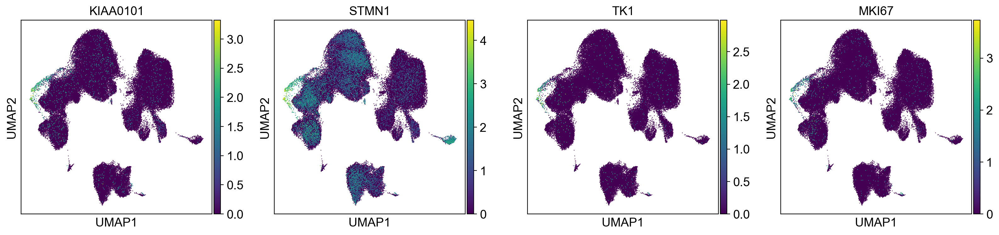

In [21]:
## cycling
sc.pl.umap(adata, color=["KIAA0101","STMN1","TK1","MKI67"], size=3)
sc.pl.umap(adata, color=["KIAA0101","STMN1","TK1","MKI67"], size=3, save='.cycling.png')

saving figure to file ./figures./umap.TNK.png


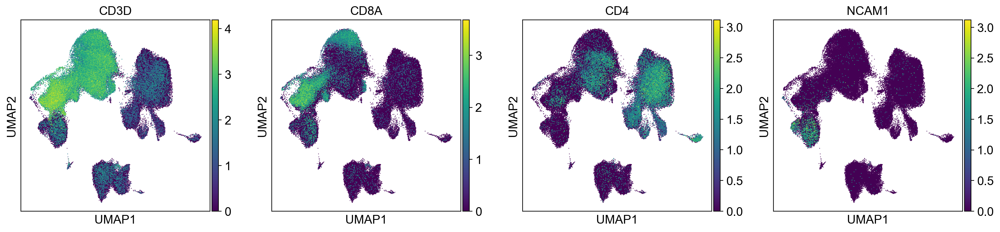

In [22]:
## CD4, CD8 and NK axis
sc.pl.umap(adata, color=["CD3D","CD8A","CD4","NCAM1"],size=3)
sc.pl.umap(adata, color=["CD3D","CD8A","CD4","NCAM1"],size=3, save=".TNK.png")

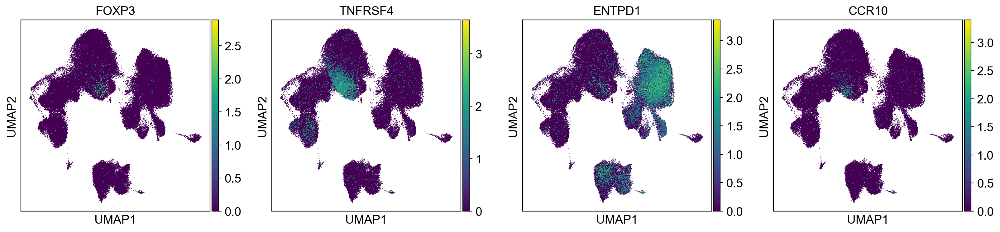

In [23]:
## treg
sc.pl.umap(adata, color=["FOXP3","TNFRSF4","ENTPD1","CCR10"],size=3)

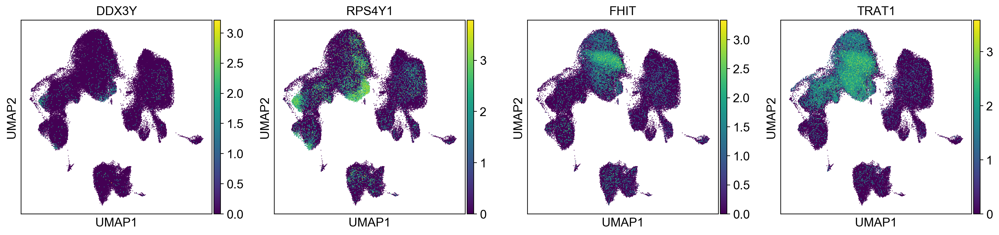

In [24]:
## y chromosome gender effect
sc.pl.umap(adata, color=["DDX3Y", "RPS4Y1", "FHIT","TRAT1"], size =3)

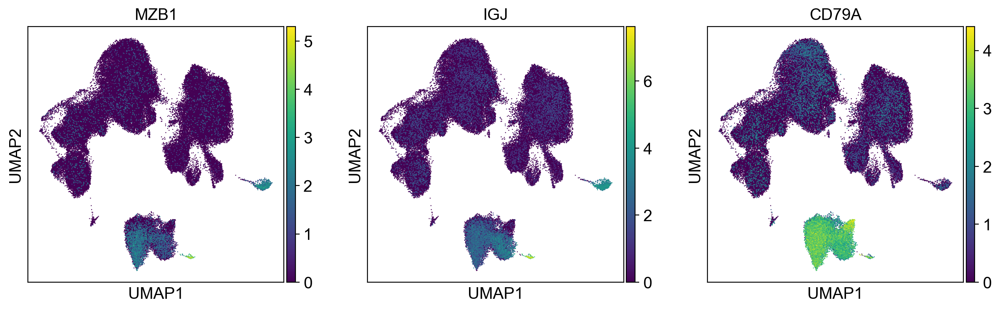

In [25]:
## b cells, plasmablasts and pdcs
sc.pl.umap(adata, color=["MZB1", "IGJ", "CD79A"],size=3)

# Figure 1D: Cell type proportion differences between case/control

## First got to compute the percentages

In [317]:
## we should be able to combine the cell type proportion estimates for the samples processed in Boston vs those processed in SF

## this neesd to be updated since right now individual 101 (1240) is treated as 4 different individuals for each pool it was run in

In [338]:
## Make proportion plots (Fig. 1D)

##adata_obs_small = adata.obs[(adata.obs.study_cov=="ImmVar") & (adata.obs.ind_cov.str.contains("IGTB")) | (~adata.obs.ind_cov.str.contains("IGTB") & (adata.obs.study_cov=="CLUES"))]
##adata_obs_small = adata.obs[(adata.obs.well.str.contains("immvar")) & (adata.obs.ind_cov.str.contains("IGTB")) | (~adata.obs.ind_cov.str.contains("IGTB") & ~adata.obs.well.str.contains("immvar"))]
adata_obs_small = adata.obs;

##ind_count = adata_obs_small.groupby(['ind_cov','study_cov','ct_cov','disease_cov','pop_cov','batch_cov'])['ct_cov'].count()
ind_count = adata_obs_small.groupby(['ind_cov','ct_cov','disease_cov','source','batch_cov'])['ct_cov'].count()

##ind_count = adata.obs.groupby(['ind_cov','study_cov','ct_cov','disease_cov','pop_cov'])['ct_cov'].count()
##ind_count = adata.obs.groupby(['ind_cov','ct_cov','disease_cov','pop_cov'])['ct_cov'].count()

##ind_count = ind_count.reset_index(name="counts")
ind_count_sums = ind_count.groupby(['ind_cov','disease_cov','source','batch_cov']).sum()
ind_count_sums = ind_count_sums.reset_index(name="counts")

ind_perc = ind_count/ind_count.groupby(['ind_cov','disease_cov','source','batch_cov']).transform(sum)*100
ind_perc = ind_perc.reset_index(name="ct_perc")

## filter samples that have < 100 cells
##ind_perc = ind_perc[ind_perc.ind_cov.isin(ind_count_sums.ind_cov[ind_count_sums.counts > 100])]


In [342]:
ind_perc['disease_source_cov'] = pd.Categorical(ind_perc.apply(lambda row: row['disease_cov'] + row['source'], axis=1))

##ct_group = pd.DataFrame( {'ct_cov':['B','CD14 Monoc','CD16 Monoc', 'CD4+ T', 'CD8+ T', 'MK', 'NK', 'cDC', 'pDC','Progenitor','Proliferat'], 'ct_group':['lymph', 'mono', 'mono', 'lymph','lymph', 'mkc','lymph','dc','pdc','progen','lymph']})
ct_group = pd.DataFrame( {'ct_cov':['B','cM','ncM', 'T4', 'T8', 'NK', 'ProlifT','C1QT', 'RBC', 'cDC', 'pDC'], 
                          'ct_group':['lymph', 'mono', 'mono', 'lymph','lymph', 'lymph', 'lymph', 'lymph', 'RBC','cdc', 'pdc']})
#ind_perc.ind_cov = ind_perc.ind_cov.apply(lambda x: x.split('_')[0])
#ind_count_sums.ind_cov = ind_count_sums.ind_cov.apply(lambda x: x.split('_')[0])
ind_perc = ind_perc.set_index('ct_cov').join(ct_group.set_index('ct_cov'))
ind_perc.ind_cov = ind_perc.ind_cov.astype("str")
##ind_perc.batch_cov = ind_perc.batch_cov.astype("str")
ind_perc.reset_index(inplace=True)
ind_perc.ct_cov = ind_perc.ct_cov.astype('category')
ind_perc.ct_cov = ind_perc.ct_cov.cat.reorder_categories(adata.obs.ct_cov.cat.categories.values)

print('as a proportion of total PBMC ')

for ct_i in range(len(np.unique(adata.obs.ct_cov))) :
    ct = ind_perc.ct_cov.cat.categories[ct_i]
    ct_perc = ind_perc.ct_perc[ind_perc.ct_cov==ct]
    disease = ind_perc.disease_cov[ind_perc.ct_cov==ct]
    disease = disease.astype("str")
    disease.values[disease!="HEALTHY"] = 0
    disease.values[disease=="HEALTHY"] = 1
    disease = sm.add_constant(disease)
    ##data = data.assign(ct_perc=ct_perc)
    print('Cell type:'+ ct)
    est=sm.OLS(ct_perc.astype(float), disease.astype(float))
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    #print(effect)
    #print(pval)
    print('Beta='+str(effect)+', pvalue='+str(pval))

as a proportion of total PBMC 
Cell type:B
Beta=1.2690057853575811, pvalue=0.6470358664310872
Cell type:C1QT
Beta=0.07145403629705747, pvalue=0.047687716168857475
Cell type:MK
Beta=-0.08422509459208229, pvalue=0.493239878810666
Cell type:NK
Beta=0.4881816273605287, pvalue=0.7670652803926544
Cell type:Progen
Beta=0.011570621491645186, pvalue=0.26235101262036953
Cell type:ProlifT
Beta=-0.5656363320354933, pvalue=0.01116833583432594
Cell type:RBC
Beta=0.017700035865003468, pvalue=0.7046996892249309
Cell type:T4
Beta=8.65593905793524, pvalue=0.0006644423755538399
Cell type:T8
Beta=-6.3345603761995, pvalue=0.05708340729428623
Cell type:cDC
Beta=1.3040242376776532, pvalue=2.6515810252045147e-06
Cell type:cM
Beta=-6.096133099539413, pvalue=0.1497043425074024
Cell type:ncM
Beta=0.07942452509080164, pvalue=0.9451068030631659
Cell type:pDC
Beta=0.5643578841123099, pvalue=2.3414064435755607e-05


In [343]:
ind_perc_healthy_unt = ind_perc[ind_perc.disease_cov.str.contains("HEALTHY|UNT",regex=True)];

print('as a proportion of total PBMC ')

for ct_i in range(len(np.unique(adata.obs.ct_cov))) :
    ct = ind_perc_healthy_unt.ct_cov.cat.categories[ct_i]
    ct_perc = ind_perc_healthy_unt.ct_perc[ind_perc_healthy_unt.ct_cov==ct]
    disease = ind_perc_healthy_unt.disease_cov[ind_perc_healthy_unt.ct_cov==ct]
    disease = disease.astype("str")
    disease.values[disease!="HEALTHY"] = 0
    disease.values[disease=="HEALTHY"] = 1
    disease = sm.add_constant(disease)
    ##data = data.assign(ct_perc=ct_perc)
    print('Cell type:'+ ct)
    est=sm.OLS(ct_perc.astype(float), disease.astype(float))
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    #print(effect)
    #print(pval)
    print('Beta='+str(effect)+', pvalue='+str(pval))

as a proportion of total PBMC 
Cell type:B
Beta=2.338705419941082, pvalue=0.3429635411743237
Cell type:C1QT
Beta=0.0699663967149918, pvalue=0.09172993356722131
Cell type:MK
Beta=-0.08286684516858751, pvalue=0.552737578350909
Cell type:NK
Beta=0.4576590836542105, pvalue=0.7612074879222157
Cell type:Progen
Beta=0.014423469884994605, pvalue=0.1753537179065631
Cell type:ProlifT
Beta=-0.7092559363882763, pvalue=0.00723316616307586
Cell type:RBC
Beta=0.045684313708130454, pvalue=0.2645774651680459
Cell type:T4
Beta=9.026142305857299, pvalue=0.002165116761486117
Cell type:T8
Beta=-10.538142975690484, pvalue=0.0029827513280109097
Cell type:cDC
Beta=1.5817767283642856, pvalue=2.9549962154270483e-07
Cell type:cM
Beta=-4.6628635592770245, pvalue=0.29248644567343923
Cell type:ncM
Beta=0.9626341964243171, pvalue=0.3943212183522238
Cell type:pDC
Beta=0.6879783392085068, pvalue=4.147340626286049e-06


## Next, let's plot the proportions

/Users/yimmieg/anaconda3/lib/python3.6/site-packages/seaborn/categorical.py:3692: UserWarning: The `size` paramter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


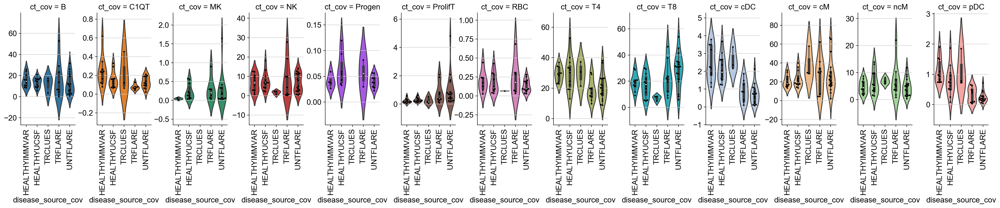

In [345]:
perc_plot = sns.catplot(x='disease_source_cov', y='ct_perc', hue='ct_cov', data=ind_perc, kind='violin', col='ct_cov', size=4, dodge=False, aspect=0.5, sharex=False, sharey=False)
perc_plot.set_xticklabels(rotation=90)
perc_plot.fig.subplots_adjust(wspace=0.4)

for ct_i in list(range(len(ind_perc.ct_cov.cat.categories))) :
    ct = ind_perc.ct_cov.cat.categories[ct_i]
    sns.swarmplot(x="disease_source_cov", y="ct_perc", data=ind_perc[ind_perc.ct_cov == ct], color="0", size=3, ax=perc_plot.axes[0,ct_i])
    perc_plot.axes[0,ct_i].get_yaxis().label.set_visible(False)
    
perc_plot.savefig(figdir+"violin.ct_cov.png")
#fig,ax = plt.subplots(nrows=1,ncols=10, figsize=(20,5))
#fig.tight_layout()

# for ct_i in list(range(10)) :
#    ct = ind_perc.ct_cov.cat.categories[ct_i]
#    sns.boxplot(x="disease_cov", y="ct_perc", data=ind_perc[ind_perc.ct_cov == ct], color=sc.pl.palettes.vega_20_scanpy[ct_i], ax=ax[ct_i])
#    sns.swarmplot(x="disease_cov", y="ct_perc", data=ind_perc[ind_perc.ct_cov == ct], color="0", size=3, ax=ax[ct_i])

/Users/yimmieg/anaconda3/lib/python3.6/site-packages/seaborn/categorical.py:3692: UserWarning: The `size` paramter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


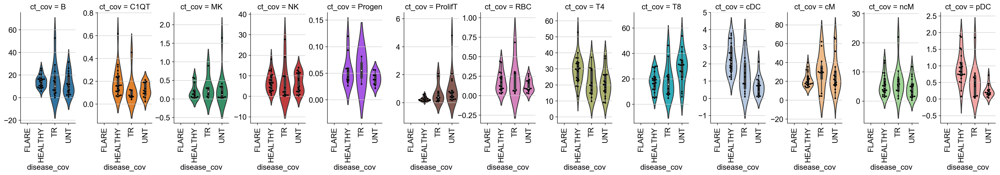

In [346]:
perc_plot = sns.catplot(x='disease_cov', y='ct_perc', hue='ct_cov', data=ind_perc, kind='violin', col='ct_cov', size=4, dodge=False, aspect=0.5, sharex=False, sharey=False)
perc_plot.set_xticklabels(rotation=90)
perc_plot.fig.subplots_adjust(wspace=0.4)

for ct_i in list(range(len(ind_perc.ct_cov.cat.categories))) :
    ct = ind_perc.ct_cov.cat.categories[ct_i]
    sns.swarmplot(x="disease_cov", y="ct_perc", data=ind_perc[ind_perc.ct_cov == ct], color="0", size=3, ax=perc_plot.axes[0,ct_i])
    perc_plot.axes[0,ct_i].get_yaxis().label.set_visible(False)
    
perc_plot.savefig(figdir+"violin.ct_cov.png")
#fig,ax = plt.subplots(nrows=1,ncols=10, figsize=(20,5))
#fig.tight_layout()

# for ct_i in list(range(10)) :
#    ct = ind_perc.ct_cov.cat.categories[ct_i]
#    sns.boxplot(x="disease_cov", y="ct_perc", data=ind_perc[ind_perc.ct_cov == ct], color=sc.pl.palettes.vega_20_scanpy[ct_i], ax=ax[ct_i])
#    sns.swarmplot(x="disease_cov", y="ct_perc", data=ind_perc[ind_perc.ct_cov == ct], color="0", size=3, ax=ax[ct_i])

In [ ]:
# fig,ax = plt.subplots(nrows=1,ncols=len(np.unique(adata.obs.ct_cov)), figsize=(50,20))
# fig.tight_layout()

# for ct_i in range(len(np.unique(adata.obs.ct_cov))) :
#     ct = ind_perc.ct_cov.cat.categories[ct_i]
#     ax[ct_i].set_yscale('log')
#     ax[ct_i].set_ylim(0.1,100)
#     sns.boxplot(x="disease_cov", y="ct_perc", data=ind_perc[ind_perc.ct_cov == ct], color=sc.pl.palettes.vega_20_scanpy[ct_i], ax=ax[ct_i])
#     sns.swarmplot(x="disease_cov", y="ct_perc", data=ind_perc[ind_perc.ct_cov == ct], color="0", size=10, ax=ax[ct_i])

In [ ]:
# fig,ax = plt.subplots(nrows=2,ncols=10, figsize=(20,10))
# fig.tight_layout()

# for ct_i in list(range(10)) :
#         ct = ind_perc.ct_cov.cat.categories[ct_i]
#         for pop_i in list(range(2)) :
#                 pop = ind_perc.pop_cov.cat.categories[pop_i]
                
#                 ##fig,ax = plt.subplots()
#                 ##fig.set_size_inches(2,8)
#                 sns.boxplot(x="disease_cov", y="ct_perc", data=ind_perc[(ind_perc.pop_cov == pop) & (ind_perc.ct_cov == ct)], color=sc.pl.palettes.vega_20_scanpy[ct_i], ax=ax[pop_i,ct_i])
#                 ##sns.swarmplot(x="disease_cov", y="ct_perc", data=ind_perc[(ind_perc.pop_cov == pop) & (ind_perc.ct_cov == ct)], color="0", size=3, ax=ax[pop_i,ct_i])


# for pop_i in list(range(2)) :
#     pop = ind_perc.pop_cov.cat.categories[pop_i]
#     perc_plot = sns.catplot(x='disease_cov', y='ct_perc', hue='ct_cov', data=ind_perc[(ind_perc.pop_cov == pop)], kind='violin', col='ct_cov', dodge=False, aspect=0.4, sharex=False, sharey=False)
    
perc_plot = sns.catplot(x='disease_cov', y='ct_perc', hue='ct_cov', data=ind_perc, kind='violin', col='ct_cov', dodge=False, size=4, aspect=1, sharex=False, sharey=False)


In [ ]:
##ax = sns.catplot(x='disease_cov', y='ct_perc', hue='ct_cov', data=ind_perc, kind='box', col='ct_cov', height=8, aspect=1/4)
##ax.savefig("figures/boxplot.cat.png")

# Figure 1E: Correlation with EHR

## Some initial data wrangling

ok, there should be 127 lupus patients and 42 immvar donors, we only have estimated PBMC numbers for 11 of them so the final joined table will only have 

In [ ]:
## Let's grab the clinical and labs data and compare to our single cell estimates
clues_clinical = pd.read_table("v2.clinical.data.txt", index_col=False)
clues_clinical.genotypeid = clues_clinical.genotypeid.apply(lambda x: x.split('_')[0])
clues_clinical.subjectid = clues_clinical.subjectid.astype("str")
joined = ind_perc.join(ind_count_sums.set_index('ind_cov'), on='ind_cov');
joined = joined.join(clues_clinical.set_index('genotypeid'), on='ind_cov')
##joined = ind_perc.join(clues_clinical.set_index('genotypeid'), on='ind_cov')

t1_labs = pd.read_table("T1labs.csv",sep=",")
t1_labs.SubjectID = t1_labs.SubjectID.astype("str")
joined = joined.join(t1_labs.set_index('SubjectID'), on='subjectid')

### test new code
joined.AbsBaso = joined.AbsBaso/1000
joined.AbsEosino = joined.AbsEosino/1000
joined.AbsLympho = joined.AbsLympho/1000
joined.AbsNeutro = joined.AbsNeutro/1000
joined.AbsMono = joined.AbsMono/1000

joined = joined.assign(pbmc = joined.WhiteBloodCell-joined.AbsNeutro-joined.AbsEosino-joined.AbsBaso)

joined[["subjectid",'WhiteBloodCell','AbsMono','AbsLympho','AbsNeutro','AbsEosino','AbsBaso','PlatCount']] = joined[["subjectid",'WhiteBloodCell','AbsMono','AbsLympho','AbsNeutro','AbsEosino','AbsBaso','PlatCount']].astype(str)

## now let's add in white blood cell counts for the immvar patients
immvar_pbmc = pd.read_table("immvar.pbmc.csv", index_col=False, sep=",")
immvar_pbmc.pbmc = immvar_pbmc.pbmc - (np.mean(immvar_pbmc.pbmc) - np.mean(joined.pbmc))
## this is not the most efficient code but will suffice for now
for i in list(range(12)) :
    igtb = immvar_pbmc.immvarid[i]
    joined.pbmc[joined.ind_cov==igtb] = immvar_pbmc.pbmc[i]

joined = joined.assign(estimate=joined.ct_perc/100*joined.pbmc)

joined[["ind_cov","disease_cov","ct_cov"]] = joined[["ind_cov","disease_cov","ct_cov"]].astype(str)
joined.plaquenilnow = joined.plaquenilnow.fillna(0)
joined.cellceptnow = joined.cellceptnow.fillna(0)
joined.steroralnow = joined.steroralnow.fillna(0)
joined.acrlymphopenia = joined.acrlymphopenia.fillna(0)


In [ ]:
sns.distplot(joined.pbmc[~np.isnan(joined.pbmc)]);

ok, so current code joins to get estimates so for those samples with pbmc NAs, they will be filtered out

In [ ]:
##joined_pivot = joined.pivot_table(index=['ind_cov',"disease_cov","pbmc","plaquenilnow","cellceptnow","steroralnow","acrlymphopenia"], columns="ct_cov", values="estimate")
joined_pivot = joined.pivot_table(index=['ind_cov',"disease_cov","pbmc","counts","batch_cov","plaquenilnow","cellceptnow","steroralnow","acrlymphopenia"], columns=["ct_cov"], values="estimate")
joined_pivot.reset_index(inplace=True)
joined_pivot.to_csv(name+"_joined_pivot_estimates.txt")

## this does not require the pbmc counts
##joined_pivot_perc = joined.pivot_table(index=['ind_cov',"disease_cov","counts","plaquenilnow","cellceptnow","steroralnow","acrlymphopenia"], columns="ct_cov", values="ct_perc")
joined_pivot_perc = joined.pivot_table(index=['ind_cov',"disease_cov","counts","batch_cov", "plaquenilnow","cellceptnow","steroralnow","acrlymphopenia"], columns="ct_cov", values="ct_perc")
joined_pivot_perc.reset_index(inplace=True)
joined_pivot_perc.to_csv(name+"_joined_pivot_ct_perc.txt")

joined_pivot = joined_pivot[joined_pivot.pbmc > 0]
joined_pivot = joined_pivot[joined_pivot.pbmc < 10]

joined_pivot.disease_cov = pd.Categorical(joined_pivot.disease_cov,categories=['healthy','sle'], ordered=True)


##joined_agg = joined.groupby(['ind_cov','subjectid','disease_cov','ct_group','WhiteBloodCell','AbsMono','AbsLympho','AbsNeutro','AbsEosino','AbsBaso','PlatCount','pbmc'])['ct_perc'].sum()
joined_agg = joined.groupby(['ind_cov','subjectid','disease_cov','ct_group','plaquenilnow','cellceptnow','steroralnow',"acrlymphopenia",'WhiteBloodCell','AbsMono','AbsLympho','AbsNeutro','AbsEosino','AbsBaso','PlatCount','pbmc'])['ct_perc'].sum()

joined_agg = joined_agg.reset_index(name='ct_perc')

joined_agg[['WhiteBloodCell','AbsMono','AbsLympho','AbsNeutro','AbsEosino','AbsBaso','PlatCount','pbmc']] = joined_agg[['WhiteBloodCell','AbsMono','AbsLympho','AbsNeutro','AbsEosino','AbsBaso','PlatCount','pbmc']].astype(float)

joined_agg = joined_agg.assign(estimate=joined_agg.ct_perc/100*joined_agg.pbmc)
joined_agg[["subjectid","disease_cov",'WhiteBloodCell','AbsMono','AbsLympho','AbsNeutro','AbsEosino','AbsBaso','PlatCount']] = joined_agg[["subjectid","disease_cov",'WhiteBloodCell','AbsMono','AbsLympho','AbsNeutro','AbsEosino','AbsBaso','PlatCount']].astype(str)
joined_agg_pivot = joined_agg.pivot_table(index=['ind_cov', "subjectid", "pbmc","disease_cov",'plaquenilnow','cellceptnow','steroralnow',"acrlymphopenia","WhiteBloodCell","AbsMono",'AbsBaso',"AbsLympho","AbsNeutro","AbsEosino","PlatCount"], columns="ct_group", values="estimate")
joined_agg_pivot.reset_index(inplace=True);

joined_agg[["subjectid",'WhiteBloodCell','AbsMono','AbsLympho','AbsNeutro','AbsEosino','AbsBaso','PlatCount']] = joined_agg[["subjectid",'WhiteBloodCell','AbsMono','AbsLympho','AbsNeutro','AbsEosino','AbsBaso','PlatCount']].astype(float)
joined_agg_pivot[["subjectid",'WhiteBloodCell','AbsMono','AbsLympho','AbsNeutro','AbsEosino','AbsBaso','PlatCount']] = joined_agg_pivot[["subjectid",'WhiteBloodCell','AbsMono','AbsLympho','AbsNeutro','AbsEosino','AbsBaso','PlatCount']].astype(float)


joined_agg_pivot_perc = joined_agg.pivot_table(index=['ind_cov', "subjectid", "pbmc","disease_cov",'plaquenilnow','cellceptnow','steroralnow',"acrlymphopenia","WhiteBloodCell","AbsMono",'AbsBaso',"AbsLympho","AbsNeutro","AbsEosino","PlatCount"], columns="ct_group", values="ct_perc")
joined_agg_pivot_perc.reset_index(inplace=True);

##joined_agg[["subjectid",'WhiteBloodCell','AbsMono','AbsLympho','AbsNeutro','AbsEosino','AbsBaso','PlatCount']] = joined_agg[["subjectid",'WhiteBloodCell','AbsMono','AbsLympho','AbsNeutro','AbsEosino','AbsBaso','PlatCount']].astype(float)
joined_agg_pivot_perc[["subjectid",'WhiteBloodCell','AbsMono','AbsLympho','AbsNeutro','AbsEosino','AbsBaso','PlatCount']] = joined_agg_pivot[["subjectid",'WhiteBloodCell','AbsMono','AbsLympho','AbsNeutro','AbsEosino','AbsBaso','PlatCount']].astype(float)

## filter for some really bad samples
joined_agg_pivot_clues = joined_agg_pivot[joined_agg_pivot.AbsMono > 5/1000]
joined_agg_pivot_clues = joined_agg_pivot_clues[joined_agg_pivot.AbsLympho > 5/1000]
joined_agg_pivot_clues = joined_agg_pivot_clues[joined_agg_pivot.WhiteBloodCell > 0]

joined_agg_clues = joined_agg[joined_agg.AbsMono > 5/1000]
joined_agg_clues = joined_agg_clues[joined_agg.AbsLympho > 5/1000]
joined_agg_clues = joined_agg_clues[joined_agg.WhiteBloodCell > 0]

## Plot correlation for monocytes and lymphocytes

In [ ]:
## calculate correlation
lympho_cor = stats.pearsonr(joined_agg_pivot_clues.lymph, joined_agg_pivot_clues.AbsLympho)
mono_cor = stats.pearsonr(joined_agg_pivot_clues.mono, joined_agg_pivot_clues.AbsMono)

fig,ax = plt.subplots(nrows=1,ncols=1, figsize=(5,5))
#fig.tight_layout()

sns.scatterplot(x='lymph', y='AbsLympho', data=joined_agg_pivot_clues, color='#8559A5',ax=ax)
ax.plot(ax.get_xlim(), ax.get_xlim(), '--', color='#000000')

sns.scatterplot(x='mono', y='AbsMono', data=joined_agg_pivot_clues, color='#F47F20',ax=ax)
ax.set(xlabel="Single Cell Counts x 10e9/L", ylabel="CBC Cell Counts x 10e9/L")

##ax[1].set(xlabel="Single Cell Counts x 10e9/L", ylabel="CBC Cell Counts x 10e9/L")
##ax[1].plot(ax[1].get_xlim(), ax[1].get_xlim(), '--', color='#000000')

fig.savefig(figdir+"ct.corr.png")

print(lympho_cor)
print(mono_cor)

## Plot cell abundance

In [ ]:
## now let's also plot the monocyte and lymphocyte counts between sle and control
## immvar samples are
##IGTB1290 IGTB1372 IGTB141 IGTB143 IGTB1506 IGTB1539 IGTB1540 IGTB1542 IGTB1575 IGTB1650 IGTB1921 IGTB195 IGTB256 IGTB469 IGTB498 IGTB508 IGTB514 IGTB645 IGTB670 IGTB826 IGTB884 IGTB986

joined_agg.disease_cov = pd.Categorical(joined_agg.disease_cov,categories=['healthy','sle'], ordered=True)
joined_agg_pivot.disease_cov = pd.Categorical(joined_agg_pivot.disease_cov,categories=['healthy','sle'], ordered=True)


fig,ax = plt.subplots(nrows=1,ncols=2, figsize=(10,8))
fig.tight_layout()

for cg_i in [0, 1] :
    cg = ['mono', 'lymph'][cg_i]
    sns.boxplot(x="disease_cov", y=cg, data=joined_agg_pivot[~(joined_agg_pivot.AbsMono < 5/1000)], color=['#F47F20','#8559A5','#7f7f7f'][cg_i], ax=ax[cg_i])
    sns.swarmplot(x="disease_cov", y=cg, data=joined_agg_pivot[~(joined_agg_pivot.AbsMono < 5/1000)], color="0", size=3, ax=ax[cg_i])

    
## now let's also plot the monocyte and lymphocyte counts between sle and control
## immvar samples are
##IGTB1290 IGTB1372 IGTB141 IGTB143 IGTB1506 IGTB1539 IGTB1540 IGTB1542 IGTB1575 IGTB1650 IGTB1921 IGTB195 IGTB256 IGTB469 IGTB498 IGTB508 IGTB514 IGTB645 IGTB670 IGTB826 IGTB884 IGTB986

# ##joined_agg.disease_cov = pd.Categorical(joined_agg.disease_cov,categories=['healthy','sle'], ordered=True)
# joined_agg_pivot_perc.disease_cov = pd.Categorical(joined_agg_pivot_perc.disease_cov,categories=['healthy','sle'], ordered=True)


# fig,ax = plt.subplots(nrows=1,ncols=3, figsize=(10,8))
# fig.tight_layout()

# for cg_i in [0, 1,2] :
#     cg = ['mono', 'lymph','lymph'][cg_i]
#     sns.boxplot(x="disease_cov", y=cg, data=joined_agg_pivot_perc[~(joined_agg_pivot_perc.AbsMono < 5/1000)], color=['#ff7f0e','#d62728','#7f7f7f'][cg_i], ax=ax[cg_i])
#     sns.swarmplot(x="disease_cov", y=cg, data=joined_agg_pivot_perc[~(joined_agg_pivot_perc.AbsMono < 5/1000)], color="0", size=3, ax=ax[cg_i])


In [ ]:
ind_perc.ct_cov.cat.categories

In [ ]:
fig,ax = plt.subplots(nrows=1,ncols=10, figsize=(20,5))
fig.tight_layout()

for ct_i in list(range(10)) :
    ct = ind_perc.ct_cov.cat.categories[ct_i]
    sns.boxplot(x="disease_cov", y=ct, data=joined_pivot, color=sc.pl.palettes.vega_20_scanpy[ct_i], ax=ax[ct_i])
    sns.swarmplot(x="disease_cov", y=ct, data=joined_pivot, color="0", size=3, ax=ax[ct_i])
    
perc_plot = sns.catplot(x='disease_cov', y='estimate', hue='ct_cov', data=joined, kind='violin', col='ct_cov', dodge=False, aspect=0.4, sharex=False, sharey=False)


In [ ]:
fig,ax = plt.subplots()
fig.set_size_inches(2,4)
ax = sns.boxplot(x="disease_cov", y="pbmc", data=joined_pivot)
ax = sns.swarmplot(x="disease_cov", y="pbmc", data=joined_pivot, color="0", size=3)


# Figure 1F: Validation of lymphopenia in EHR

In [ ]:
## Now let's analyze the EHR data
ehr = pd.read_table("meena_lupus_2017-11-15.csv", sep=",")
ehr_pivot = ehr.pivot_table(index=['Patient_ID',"Lab_Age","Patient_Sex","Patient_Race","CASE"],columns="Lab_Name",values="Lab_Value")
ehr_pivot.reset_index(inplace=True)
ehr_pivot = ehr_pivot[ehr_pivot['monocyte abs count'] < 5]
ehr_pivot = ehr_pivot[ehr_pivot['lymphocyte abs cnt'] < 6]

fig,ax = plt.subplots(nrows=3,ncols=3, figsize=(10,10))
fig.tight_layout()
plt.subplots_adjust(wspace=0.2, hspace=0.1)

## find samples with both monocyte and lymphocyte count
for cg_i in [0, 1, 2] :
    cg = ['monocyte abs count', 'lymphocyte abs cnt', 'wbc count'][cg_i]
    for r_i in [0,1,2] :
        race = ['White or Caucasian', 'Black or African American', 'Asian'][r_i]
        sns.boxplot(x="CASE", y=cg, data=ehr_pivot[ehr_pivot.Patient_Race==race], color=['#F47F20','#8559A5','#7f7f7f'][cg_i], ax=ax[cg_i,r_i])
        sns.swarmplot(x="CASE", y=cg, data=ehr_pivot[ehr_pivot.Patient_Race==race], color="0", size=3, ax=ax[cg_i,r_i])
        ax[cg_i,r_i].get_xaxis().set_visible(False)
        ax[cg_i,r_i].get_yaxis().label.set_visible(False)


fig.savefig(figdir+"ehr.boxplot.png")

perc_plot = sns.catplot(x='CASE', y='Lab_Value', col='Lab_Name', data=ehr, kind='violin', row='Patient_Race', dodge=False, aspect=0.4, sharex=False, sharey=False)

## test for differences in abundance
for cg_i in [0, 1] :
    cg = ['monocyte abs count', 'lymphocyte abs cnt'][cg_i]
    for race in ['White or Caucasian', 'Black or African American', 'Asian'] :
        abundance = ehr_pivot[ehr_pivot.Patient_Race==race][cg].values
        disease = ehr_pivot.CASE[ehr_pivot.Patient_Race==race]
        disease = sm.add_constant(disease)
        print('Cell type:'+ ct +",Race:"+race)
        est=sm.OLS(abundance.astype(float), disease.astype(float))
        est=est.fit()
        effect=est.params[1]
        pval=est.pvalues[1]
        print('Beta='+str(effect)+', pvalue='+str(pval))
        


In [ ]:
sns.scatterplot(joined_agg_pivot_clues.lymph, joined_agg_pivot_clues.acrlymphopenia)

# Supplementary figures

## Take a look at the effects of treatment

In [ ]:
fig,ax = plt.subplots(nrows=1,ncols=3, figsize=(10,8))
fig.tight_layout()

joined_pivot_perc.plaquenilnow[(joined_pivot_perc.disease_cov=="healthy")] = "2";
joined_pivot_perc.cellceptnow[(joined_pivot_perc.disease_cov=="healthy")] = "2";
joined_pivot_perc.steroralnow[(joined_pivot_perc.disease_cov=="healthy")] = "2";

for drug_i in [0, 1,2] :
    drug = ["plaquenilnow", "cellceptnow", "steroralnow"][drug_i]
    ##cg = ['mono', 'lymph','lymph'][cg_i]
    sns.boxplot(x=drug, y="cM", data=joined_pivot_perc, color='#F47F20', ax=ax[drug_i])

fig,ax = plt.subplots(nrows=1,ncols=3, figsize=(10,8))
fig.tight_layout()

for drug_i in [0, 1,2] :
    drug = ["plaquenilnow", "cellceptnow", "steroralnow"][drug_i]
    ##cg = ['mono', 'lymph','lymph'][cg_i]
    sns.boxplot(x=drug, y="Th", data=joined_pivot_perc, color='#8559A5', ax=ax[drug_i])
